In [22]:
# from __future__ import print_function
# import time
# import numpy as np
# import pandas as pd
# # from sklearn.datasets import fetch_mldata
# from sklearn.decomposition import PCA
# from sklearn.manifold import TSNE
# %matplotlib inline
# import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D
# import seaborn as sns
# from matplotlib.colors import LogNorm
# import umap.umap_ as uma
# import math
# from collections import Counter

In [1]:
from plotting import *
from Execute116 import *

In [2]:
from sklearn.manifold import TSNE

In [3]:
sys.path.insert(0, r'C:\Users\viska\Documents\AceCan')
os.chdir(r"C:\Users\viska\Documents\AceCan")
Output_path = r"C:\Users\viska\Documents\AceCan\Prepros"
# os.mkdir(Output_path)
load_data = 1
num = 40
base = 8
topk = 2000
col_range =  [8000]
row_range = [5]
display = 20
pca_comp = 8
d = base ** pca_comp  
data_dir = r'.\bki'    
test =1
name = os.path.join(Output_path, f'b{base}topk{topk}N{num}test{test}')
idx_plot = 3
# os.mkdir(name)
if test:
    pixel = 400*300
else:
    pixel = 1004 * 1344
# os.mkdir(name)

In [4]:
data1Ds, pc, mul_comb = process_dataset(data_dir, base, num, pca_comp, topk, test)

Processing 40 [test :1] images with original size [1004, 1344, 35] 
=============== run step PCA ===============
Explained Variance Ratio [0.759 0.133 0.065 0.025 0.01  0.003 0.002 0.001 0.001 0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   ]


## Check PC Components

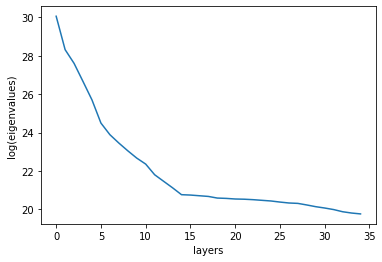

In [5]:
test_mul_comb(mul_comb,pc, pca_comp)

We see around 5-10 pc components.

In [6]:
# pt = Plotting(ver = 1004, hor = 1344)
pt = Plotting()

## Processing PCA

In [7]:
intensity, pca_results = process_pca(data1Ds, pc, num, pca_comp)

========= Intensity ==============


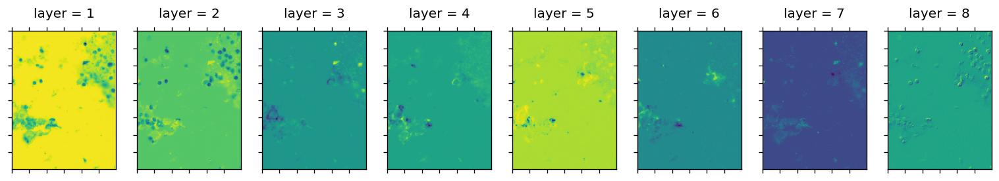

In [8]:
idx = 7
pt.plot_pca_data(pca_results[pixel*idx:pixel*(idx+1), :].T)

## Process Intensity

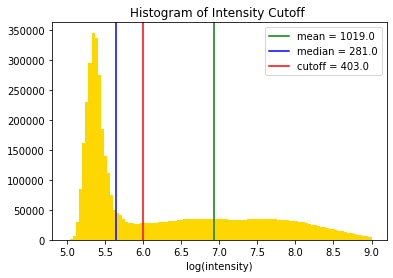

In [9]:
cutoffH,_,_ = get_intensity_hist(intensity, cutoff_log = 6, range = (5,9))

In [10]:
stream_1D, norm_data, mask = process_intensity(pca_results, intensity, cutoffH, base, pca_comp)

norm length 2111704
norm_data -0.9995148497417065 0.5559351436146849
rebin, min/mac 0.0 6.0


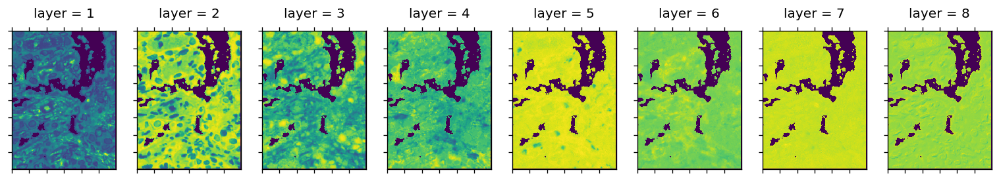

In [11]:
_ = pt.test_norm(norm_data,mask, idx = 6, bg = -1.1 )

rebin, min/mac 0.0 6.0


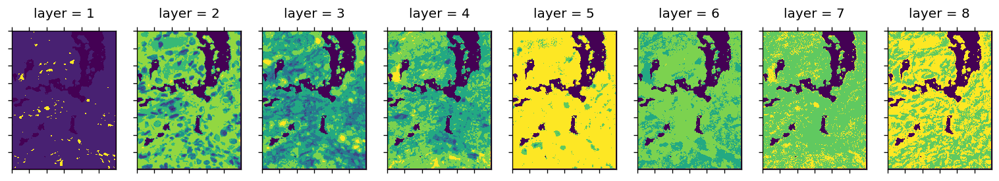

In [12]:
_ = pt.test_rebin(norm_data,mask, idx = 6 )

## Counting Heavy Hitters Traditionally

In [14]:
exact_pdh, exact_pd = process_stream_1D(stream_1D, base, pca_comp, topk = 10000, percentage = 0.01)

498.75
#exact_pdh 604 498.75
        0    1    2    3    4    5    6    7   freq       val
0     0.0  5.0  4.0  4.0  4.0  3.0  3.0  4.0  49875   9292072
1     0.0  5.0  3.0  3.0  4.0  4.0  3.0  4.0  39918   9324264
2     0.0  5.0  4.0  3.0  4.0  4.0  3.0  4.0  32220   9324328
3     0.0  4.0  3.0  3.0  4.0  4.0  3.0  4.0  28804   9324256
4     0.0  4.0  3.0  4.0  3.0  3.0  3.0  4.0  28127   9287904
...   ...  ...  ...  ...  ...  ...  ...  ...    ...       ...
2171  1.0  0.0  3.0  4.0  3.0  3.0  4.0  3.0      1   7452865
2172  0.0  3.0  2.0  3.0  2.0  3.0  4.0  3.0      1   7448216
2173  0.0  4.0  3.0  5.0  2.0  3.0  4.0  4.0      1   9546464
2174  0.0  1.0  2.0  5.0  3.0  3.0  4.0  3.0      1   7453320
2175  0.0  3.0  3.0  3.0  3.0  4.0  4.0  5.0      1  11679448

[2176 rows x 10 columns]
C:\Users\viska\.conda\envs\streaming\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
  """


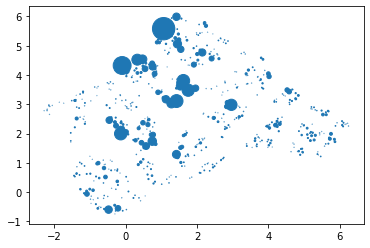

In [15]:
umap_result = process_umap(exact_pdh, pca_comp)


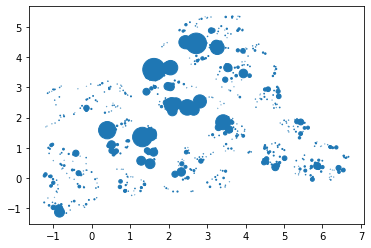

In [15]:
# umap_result = process_umap(exact_pdh, pca_comp)

In [16]:
exact_pdh['u1'] = umap_result[:,0] 
exact_pdh['u2'] = umap_result[:,1]
# np.savetxt(f'{name}/exact_pdh.cvs', exact_pdh)


C:\Users\viska\.conda\envs\streaming\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\viska\.conda\envs\streaming\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 604 samples in 0.001s...
[t-SNE] Computed neighbors for 604 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 604 / 604
[t-SNE] Mean sigma: 0.807292
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.914299
[t-SNE] KL divergence after 300 iterations: 1.166664


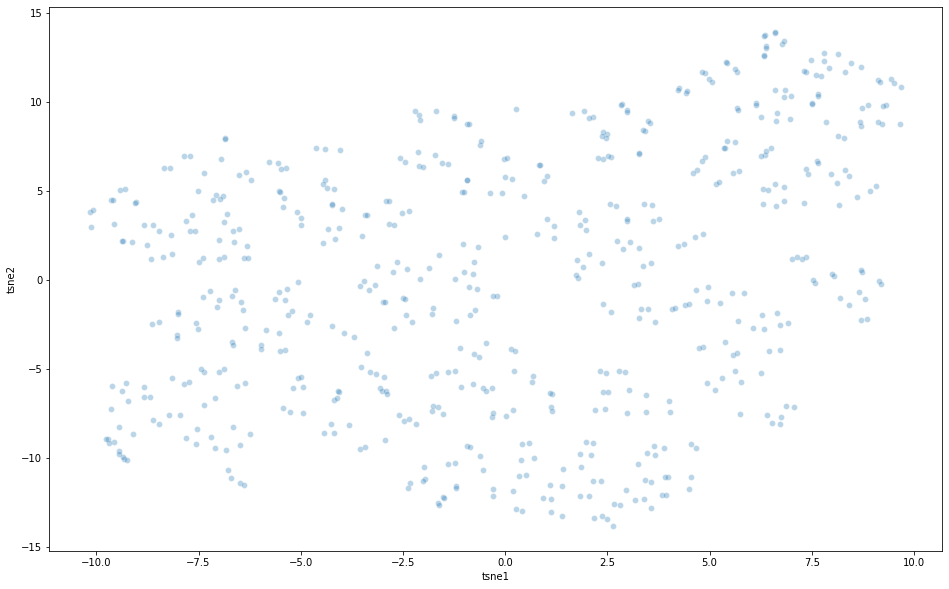

In [66]:
# tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300) 
# tsne_results = tsne.fit_transform(exact_pdh[range(8)])
# exact_pdh['tsne1'] = tsne_results[:,0]
# exact_pdh['tsne2'] = tsne_results[:,1]
# plt.figure(figsize=(16,10))
# sns.scatterplot(
#     x="tsne1", y="tsne2",
# #     hue="y",
#     palette=sns.color_palette("hls", 10),
#     data=exact_pdh,
#     legend="full",
#     alpha=0.3
# )
# # np.savetxt(f'{name}/exact_pdh', exact_pdh)

In [17]:
exact_pdh['idx'] = np.arange(len(exact_pdh))
np.savetxt(f'{name}/exact_pdh.cvs', exact_pdh)

C:\Users\viska\.conda\envs\streaming\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [30]:
print(f'{name}/exact_pdh.cvs')

C:\Users\viska\Documents\AceCan\Prepros\b8topk2000N40test1/exact_pdh.cvs


In [ ]:
np.savetxt(f'{name}/exact_pdh.cvs', exact_pdh)

In [29]:
exact_pdh

,0,1,2,3,4,5,6,7,freq,val,u1,u2,idx
0,0.0,5.0,4.0,4.0,4.0,3.0,3.0,4.0,49875,9292072,1.063387,5.582517,0
1,0.0,5.0,3.0,3.0,4.0,4.0,3.0,4.0,39918,9324264,-0.100575,4.324712,1
2,0.0,5.0,4.0,3.0,4.0,4.0,3.0,4.0,32220,9324328,1.158824,5.578264,2
3,0.0,4.0,3.0,3.0,4.0,4.0,3.0,4.0,28804,9324256,1.425807,3.109318,3
4,0.0,4.0,3.0,4.0,3.0,3.0,3.0,4.0,28127,9287904,1.616792,3.802155,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
599,0.0,5.0,2.0,2.0,3.0,3.0,3.0,4.0,519,9286824,-0.809919,3.296828,599
600,0.0,2.0,2.0,4.0,3.0,4.0,3.0,4.0,513,9320592,2.319675,1.000238,600
601,0.0,4.0,5.0,3.0,4.0,4.0,3.0,3.0,508,7227232,2.441728,5.405262,601
602,0.0,3.0,3.0,4.0,2.0,3.0,3.0,4.0,505,9283800,2.696003,3.312973,602


In [19]:
exact_pdh1 = exact_pdh

In [20]:
limit = 100
clusters, cluster_dict = get_merged_HHs(exact_pdh['val'], base, limit)
clusters

Counter({(3, 10): 23, (2, 3): 20, (6, 7): 13, (7, 9): 11, (9, 15): 9, (2, 10): 7, (6, 9): 6, (3, 4): 5, (9, 20): 5, (5, 6): 4, (14, 19): 3, (6, 20): 3, (3, 11): 2, (2, 11): 2, (6, 18): 2, (15, 20): 2, (2, 8): 2, (2, 4): 1, (4, 10): 1, (7, 18): 1, (6, 22): 1, (7, 30): 1, (7, 15): 1, (1, 13): 1, (3, 25): 1, (3, 8): 1, (6, 38): 1})


array([ 1.,  2.,  2.,  2.,  3.,  2.,  3.,  3.,  1.,  3.,  1.,  2.,  3.,
        3.,  4.,  3.,  5.,  3.,  1.,  1.,  6.,  2.,  2.,  3.,  7.,  1.,
        3.,  8.,  6.,  3.,  3.,  3.,  2.,  6.,  6.,  7.,  3.,  5.,  9.,
        2.,  3.,  3.,  2., 10.,  3., 10.,  3., 11.,  6.,  6.,  6.,  3.,
        3., 10.,  9.,  2.,  3., 12.,  2., 12.,  3., 12.,  1., 13.,  3.,
       10.,  6.,  3.,  2.,  3., 10.,  2.,  2.,  2., 14., 14.,  6.,  2.,
        6., 12.,  9.,  6.,  3.,  2.,  6., 12.,  3.,  3.,  6., 10.,  3.,
        2.,  3.,  6.,  2.,  7.,  2.,  9., 14., 10.,  7.,  2.,  6.,  3.,
       10.,  6.,  2., 14.,  3.,  8., 15.,  3.,  3., 10.,  3., 10., 14.,
        2.,  2., 16., 15., 10., 10.,  5., 10.,  3.,  5., 17., 18., 15.,
        2.,  7.,  2.,  7.,  6., 19.,  2.,  3.,  5., 20., 13., 19.,  6.,
        6., 15.,  6., 15., 19., 21., 21., 19., 10., 10., 16., 13.,  3.,
        6.,  9.,  2., 15.,  3., 15.,  3.,  6.,  2.,  5., 21., 10.,  2.,
        7.,  3.,  6., 10., 19.,  2., 11.,  6.,  3., 15.,  3.,  6

In [23]:
final_results, binary_results = plot_HH_masked(stream_1D, mask, cluster_dict, bg = -1)

ini,fin 5 20
0.0 41.0
1


In [27]:
pt.n_ver = 4
pt.n_hor = 10

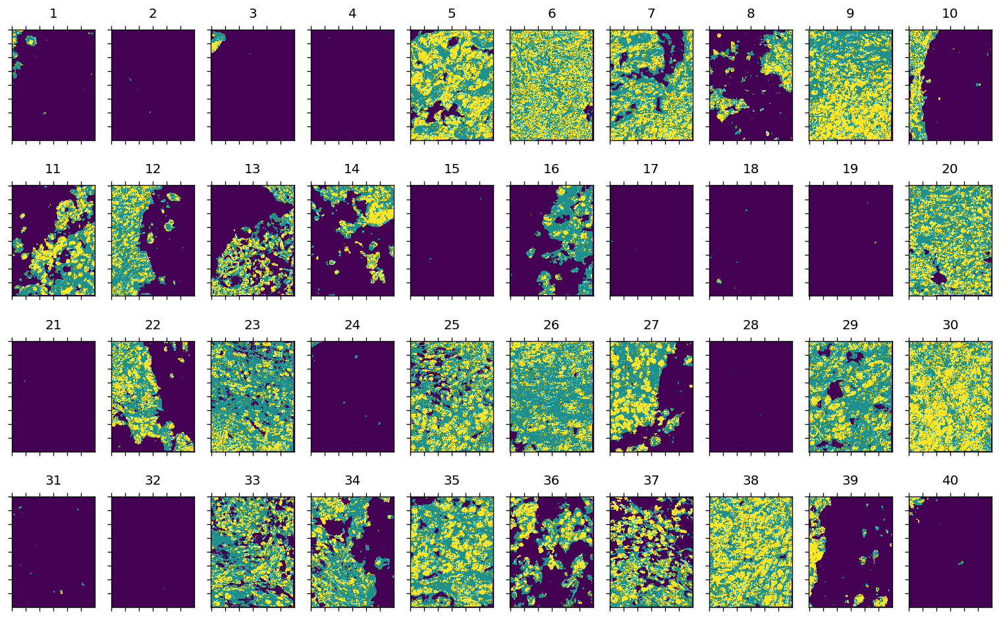

In [28]:
pt.plot_masked(binary_results)

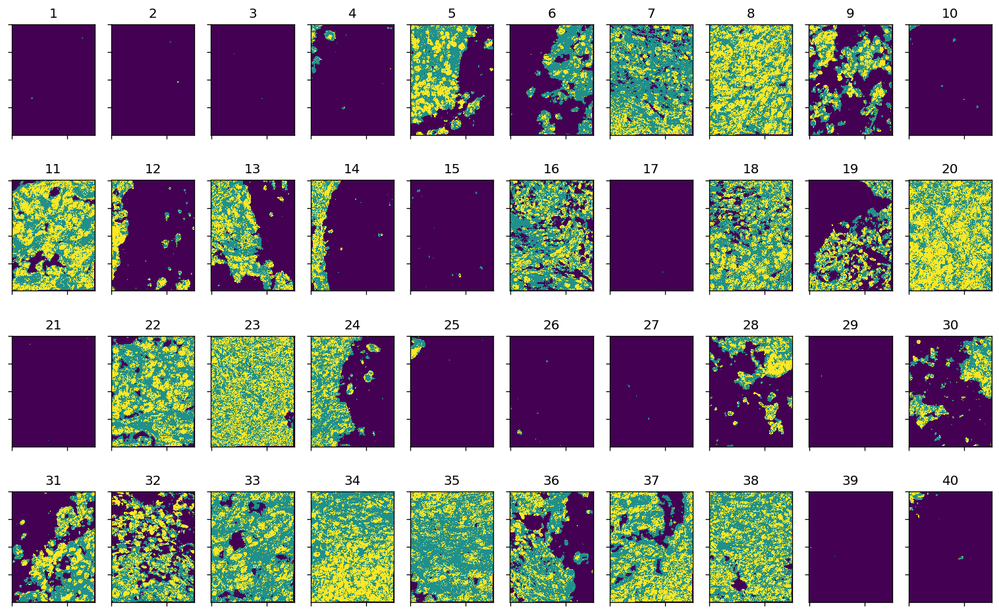

In [660]:
pt.plot_masked(final_results)

## Gluviz Clustering

In [31]:
from glue.core.state import load

In [40]:
data_collection = load(f'{name}\\make_plot.py.data')
data0 = data_collection[0]

In [47]:
# FIND ORDER
sub_range = [0,1,2,3,4,7,6,5]
for subset in sub_range:
    layer_data = data0.subsets[subset]
    print(subset,layer_data['col13'][:10])

0 [ 0.  2. 10. 13. 18. 24. 25. 28. 51. 62.]
1 [ 1.  8. 11. 20. 26. 34. 35. 50. 55. 77.]
2 [ 3.  4.  6.  9. 15. 17. 23. 32. 36. 40.]
3 [ 5. 12. 21. 22. 30. 33. 39. 41. 42. 47.]
4 [  7.  44.  46.  67.  70.  91. 125. 139. 141. 172.]
7 [ 16.  27.  37.  85. 109. 119. 123. 126. 145. 165.]
6 [ 14.  56.  60.  64.  86.  90.  92.  94. 137. 181.]
5 [ 19.  29.  31.  66. 100. 104. 106. 111. 114. 162.]


In [146]:
exact_pdh = exact_pdh.drop('cluster', axis = 1)

In [140]:
def get_cluster_idx(data0, sub_range, exact_pdh, col = 'col13'):
    cluster = {}
    i = 1
    for subset in sub_range:
        layer_data = data0.subsets[subset]
        cluster[i] = layer_data[col].astype(int)
        i+=1
    exact_pdh['cluster'] = np.zeros(len(exact_pdh)).astype(int)
    for key in range(1,max(sub_range)+2):
        exact_pdh.loc[cluster[key],'cluster'] = int(key)
    return None

In [148]:
get_cluster_idx(data0,sub_range, exact_pdh)

,0,1,2,3,4,5,6,7,freq,val,u1,u2,cluster
0,0.0,5.0,4.0,4.0,4.0,3.0,3.0,4.0,49875,9292072,1.063387,5.582517,1
1,0.0,5.0,3.0,3.0,4.0,4.0,3.0,4.0,39918,9324264,-0.100575,4.324712,2
2,0.0,5.0,4.0,3.0,4.0,4.0,3.0,4.0,32220,9324328,1.158824,5.578264,1
3,0.0,4.0,3.0,3.0,4.0,4.0,3.0,4.0,28804,9324256,1.425807,3.109318,3
4,0.0,4.0,3.0,4.0,3.0,3.0,3.0,4.0,28127,9287904,1.616792,3.802155,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
599,0.0,5.0,2.0,2.0,3.0,3.0,3.0,4.0,519,9286824,-0.809919,3.296828,0
600,0.0,2.0,2.0,4.0,3.0,4.0,3.0,4.0,513,9320592,2.319675,1.000238,0
601,0.0,4.0,5.0,3.0,4.0,4.0,3.0,3.0,508,7227232,2.441728,5.405262,0
602,0.0,3.0,3.0,4.0,2.0,3.0,3.0,4.0,505,9283800,2.696003,3.312973,0


In [120]:
exact_pdh
# exact_pdh = exact_pdh.drop(['idx'], axis = 1)

,0,1,2,3,4,5,6,7,freq,val,u1,u2,cluster
0,0.0,5.0,4.0,4.0,4.0,3.0,3.0,4.0,49875,9292072,1.063387,5.582517,1
1,0.0,5.0,3.0,3.0,4.0,4.0,3.0,4.0,39918,9324264,-0.100575,4.324712,2
2,0.0,5.0,4.0,3.0,4.0,4.0,3.0,4.0,32220,9324328,1.158824,5.578264,1
3,0.0,4.0,3.0,3.0,4.0,4.0,3.0,4.0,28804,9324256,1.425807,3.109318,3
4,0.0,4.0,3.0,4.0,3.0,3.0,3.0,4.0,28127,9287904,1.616792,3.802155,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
599,0.0,5.0,2.0,2.0,3.0,3.0,3.0,4.0,519,9286824,-0.809919,3.296828,0
600,0.0,2.0,2.0,4.0,3.0,4.0,3.0,4.0,513,9320592,2.319675,1.000238,0
601,0.0,4.0,5.0,3.0,4.0,4.0,3.0,3.0,508,7227232,2.441728,5.405262,0
602,0.0,3.0,3.0,4.0,2.0,3.0,3.0,4.0,505,9283800,2.696003,3.312973,0


In [93]:
exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] > 1]

In [135]:
def plot_umap_clusters(stream_1D, exact_pdhh, bg = -1 ):
    HHvals = np.array(exact_pdhh['val'])
    HHcluster = np.array(exact_pdhh['cluster'])
    masked_streams = np.zeros(np.shape(stream_1D))
    for idx, val in enumerate( HHvals): 
        label = HHcluster[idx]
        masked_streams = np.where(stream_1D != val, masked_streams, label)
    final_umap = np.ones(mask.shape) * bg
    binary_umap = np.ones(mask.shape) * bg
    masked_binary = (masked_streams > 0) * 1
    final_umap[mask] = masked_streams
    binary_umap[mask] = masked_binary
    return final_umap, binary_umap,  masked_streams 

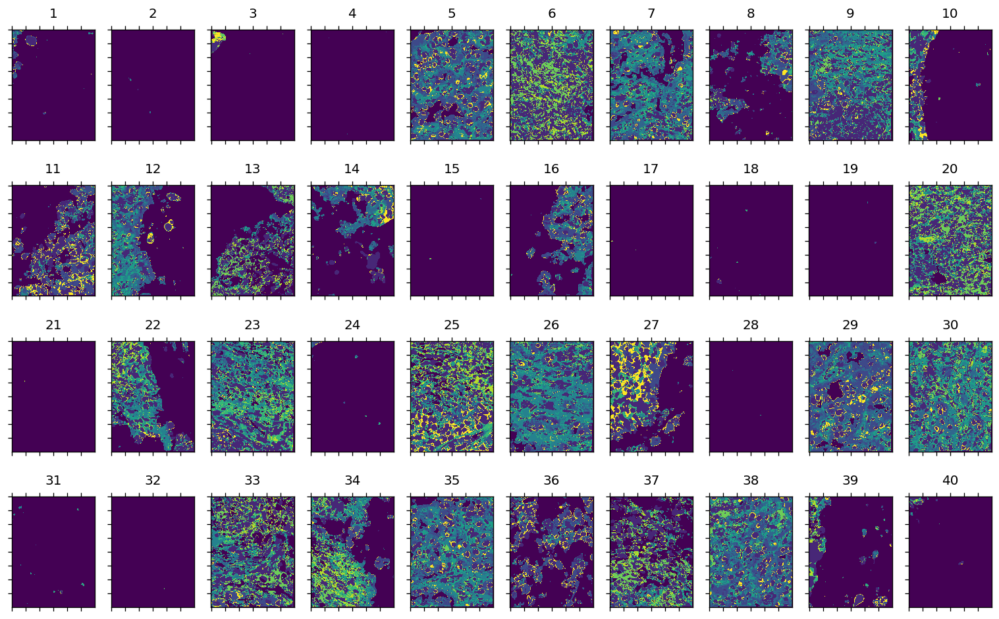

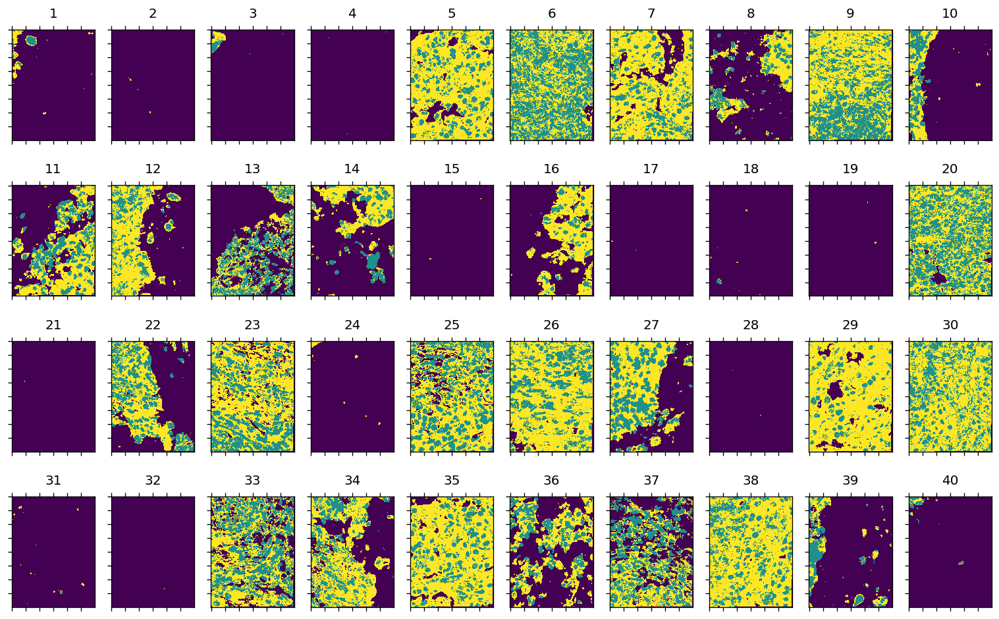

In [138]:
exact_pdhh = exact_pdh
final_umap, binary_umap, masked_streams  = plot_umap_clusters(stream_1D, exact_pdhh)
pt.plot_masked(final_umap)
pt.plot_masked(binary_umap)

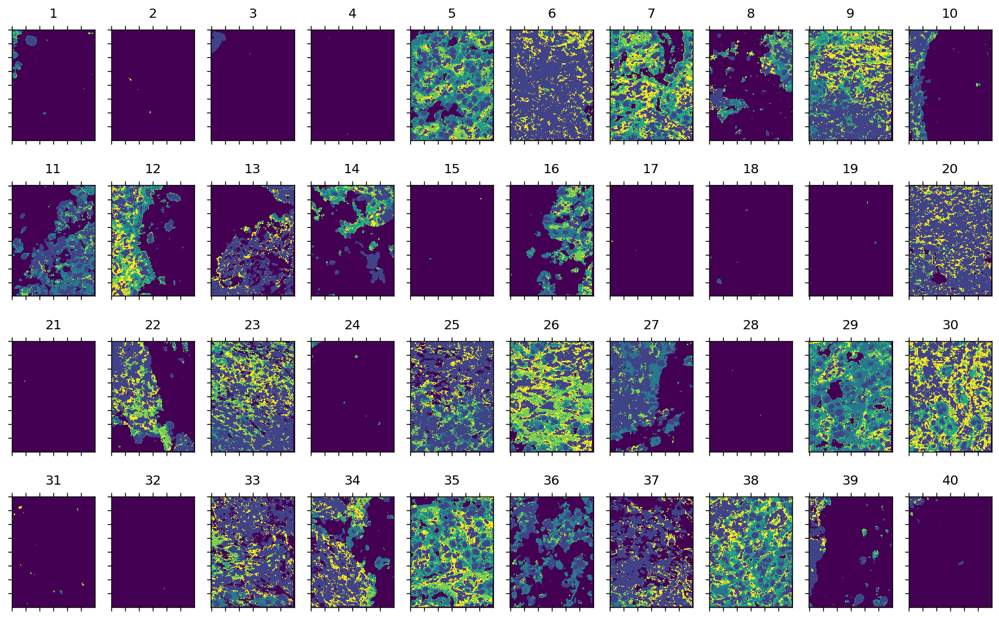

In [136]:
# exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] > 1]
# exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] < 5]
exact_pdhh = exact_pdh
final_umap, binary_umap, masked_streams  = plot_umap_clusters(stream_1D, exact_pdhh)
pt.plot_masked(final_umap)
# cluster 2 pos

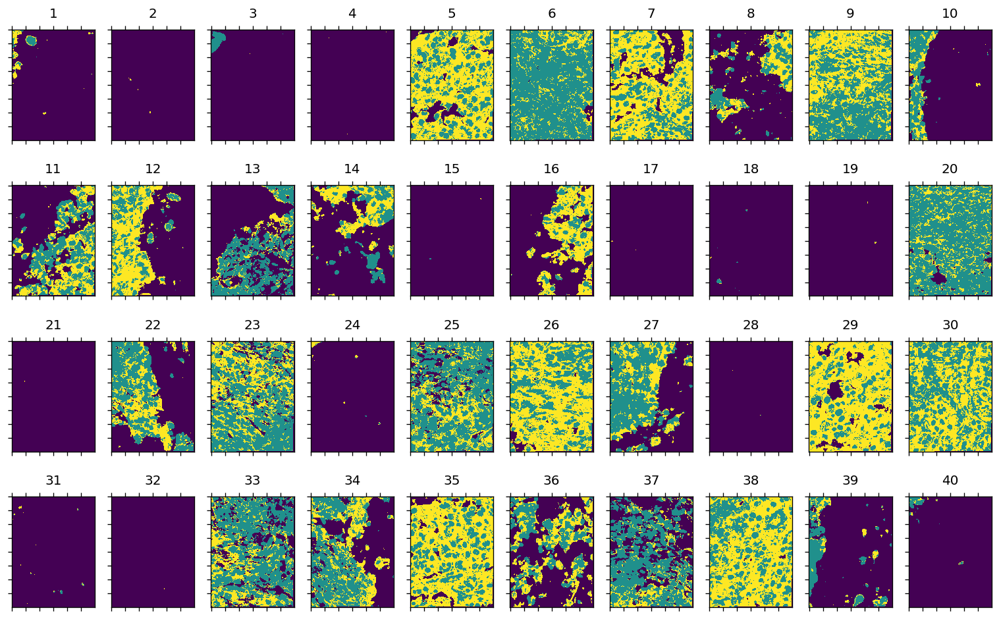

In [137]:
pt.plot_masked(binary_umap)

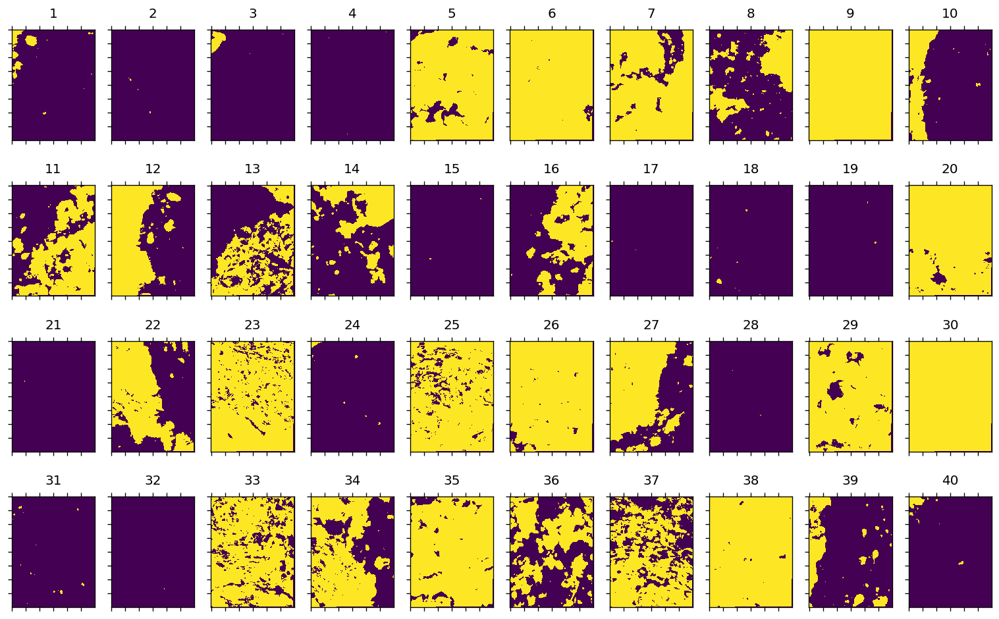

In [123]:
exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] == 0]
final_umap, masked_streams  = plot_umap_clusters(stream_1D, exact_pdhh)
pt.plot_masked(final_umap)
# cluster 2 pos

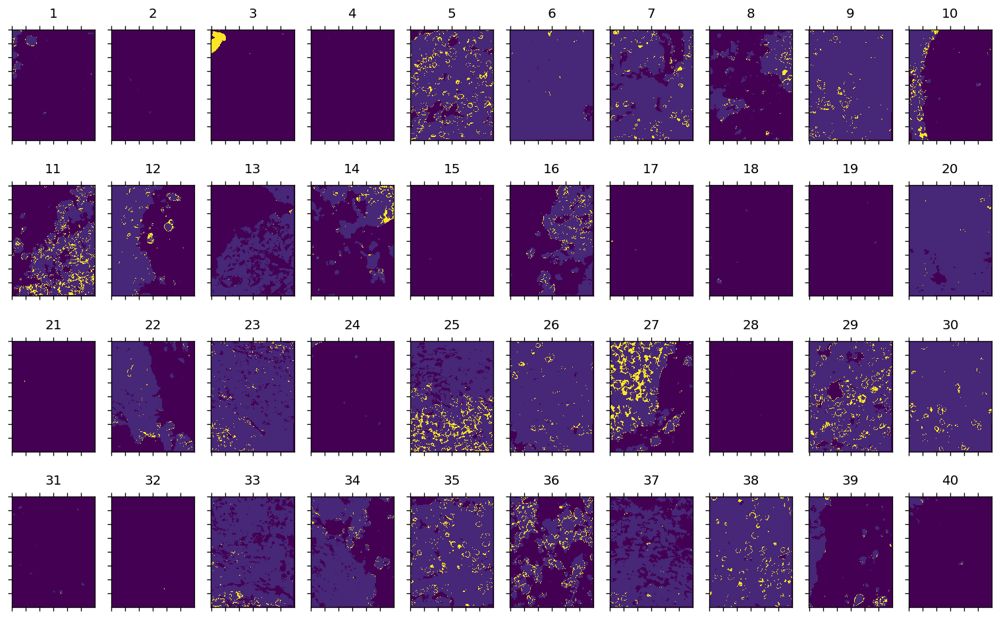

In [124]:
exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] == 8]
final_umap, masked_streams  = plot_umap_clusters(stream_1D, exact_pdhh)
pt.plot_masked(final_umap)
# cluster 2 pos

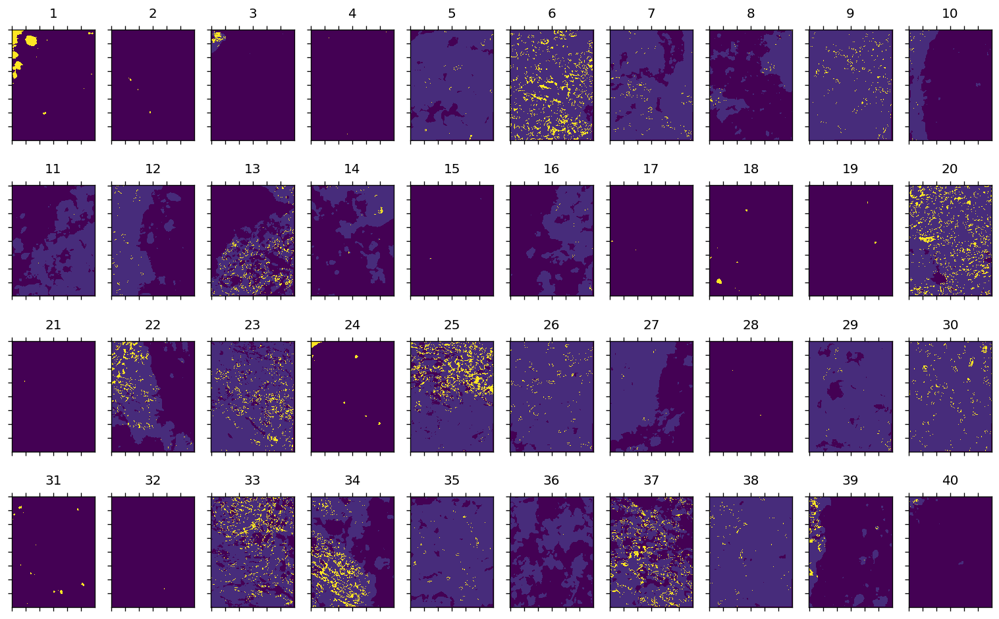

In [125]:
exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] == 7]
final_umap, masked_streams  = plot_umap_clusters(stream_1D, exact_pdhh)
pt.plot_masked(final_umap)
# cluster 2 pos

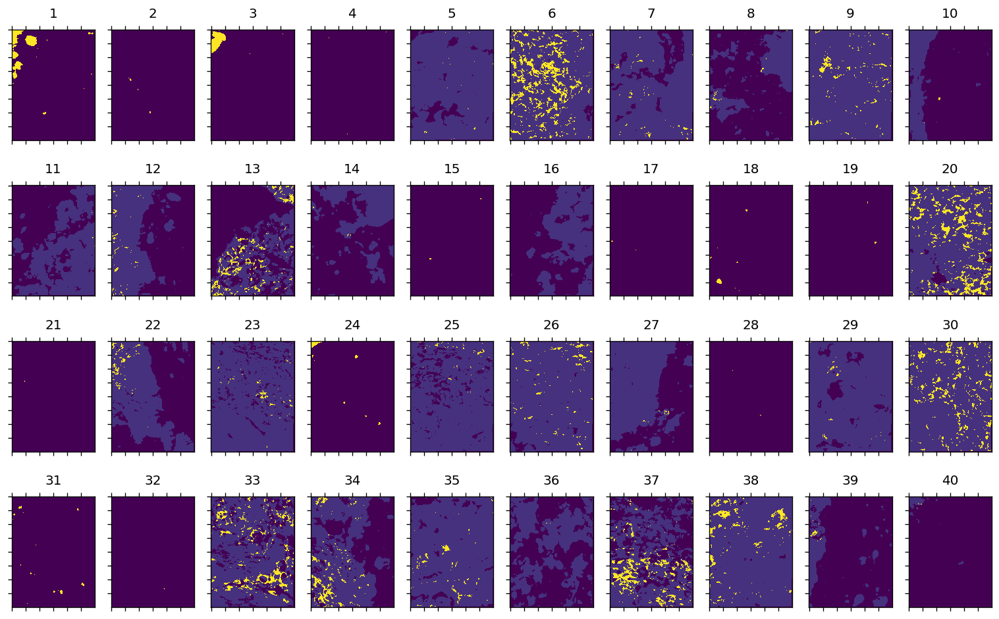

In [126]:
exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] == 6]
final_umap, masked_streams  = plot_umap_clusters(stream_1D, exact_pdhh)
pt.plot_masked(final_umap)
# cluster 2 pos

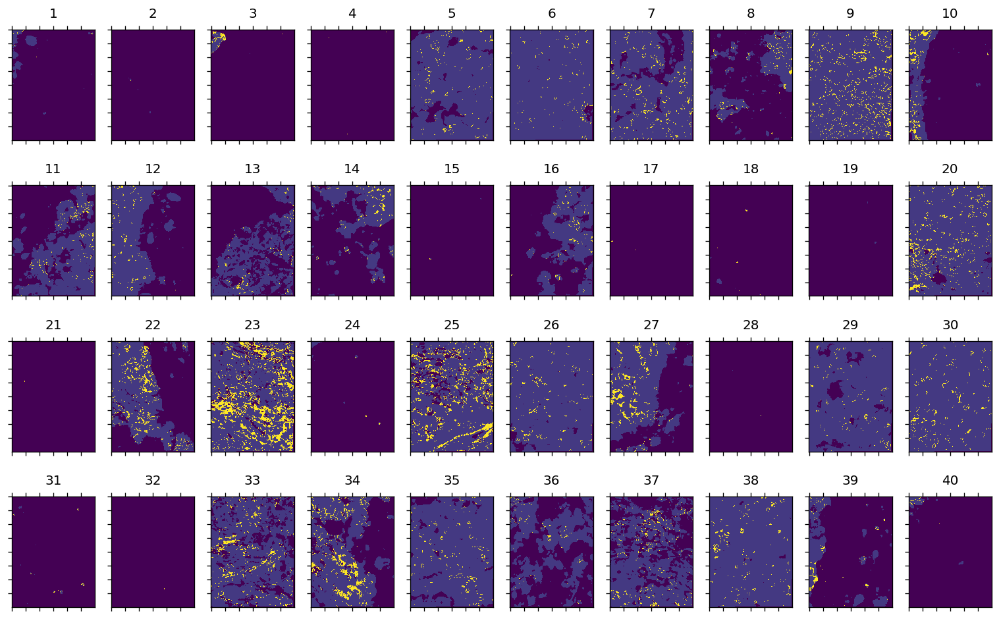

In [127]:
exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] == 5]
final_umap, masked_streams  = plot_umap_clusters(stream_1D, exact_pdhh)
pt.plot_masked(final_umap)
# cluster 2 pos

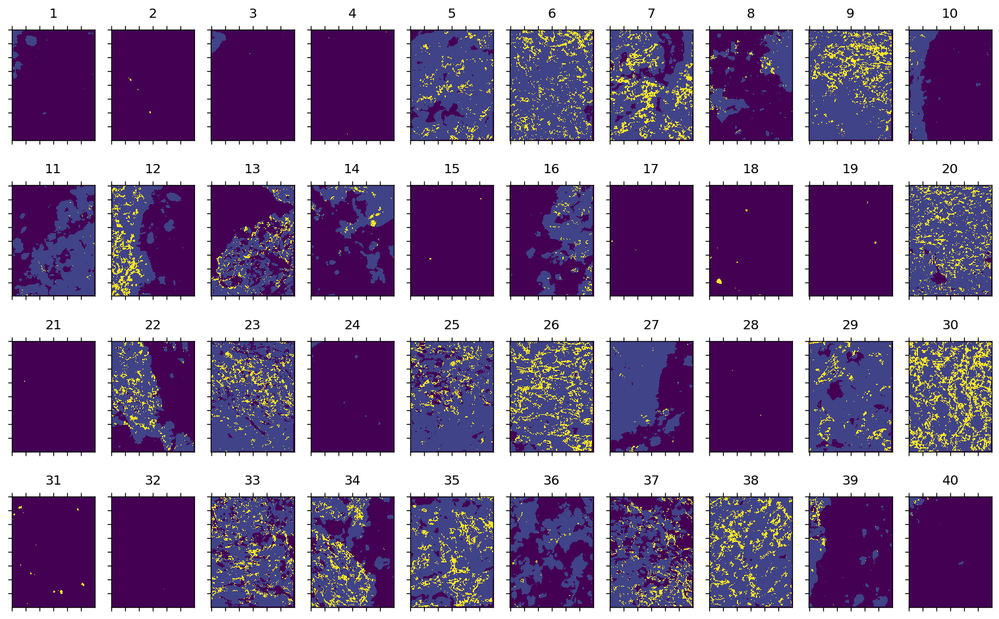

In [128]:
exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] == 4]
final_umap, masked_streams  = plot_umap_clusters(stream_1D, exact_pdhh)
pt.plot_masked(final_umap)
# cluster 2 pos

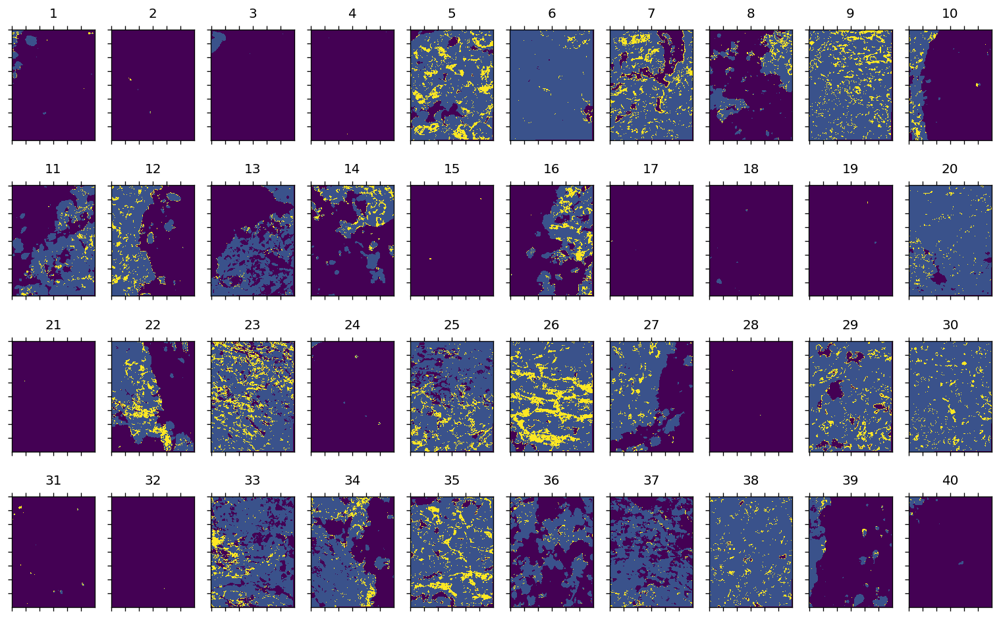

In [107]:
exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] == 3]
final_umap, masked_streams  = plot_umap_clusters(stream_1D, exact_pdhh)
pt.plot_masked(final_umap)
# cluster 2 pos

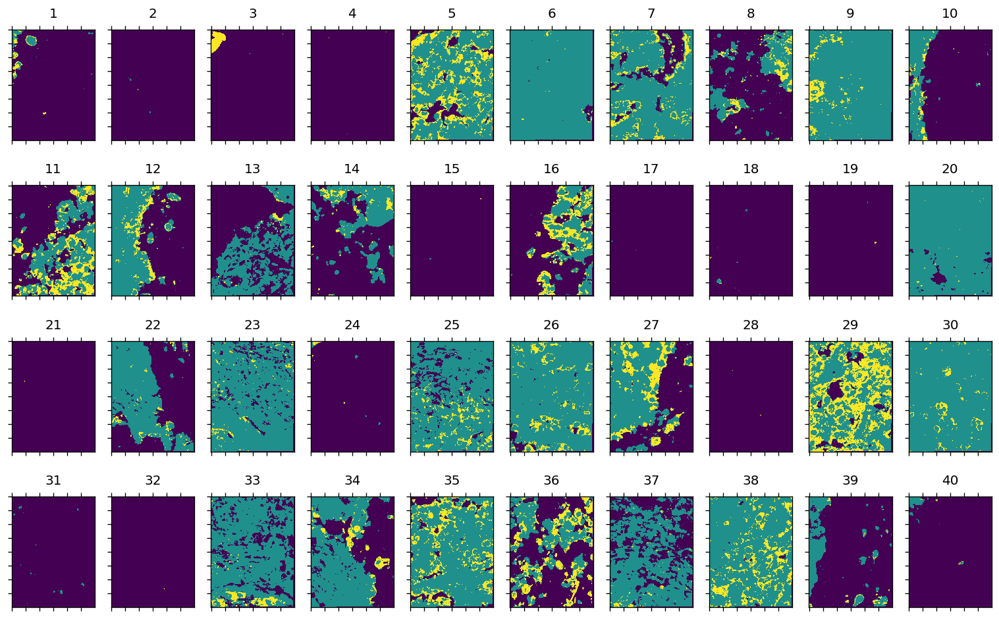

In [108]:
exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] == 1]
final_umap, masked_streams  = plot_umap_clusters(stream_1D, exact_pdhh)
pt.plot_masked(final_umap)
# cluster 2 pos

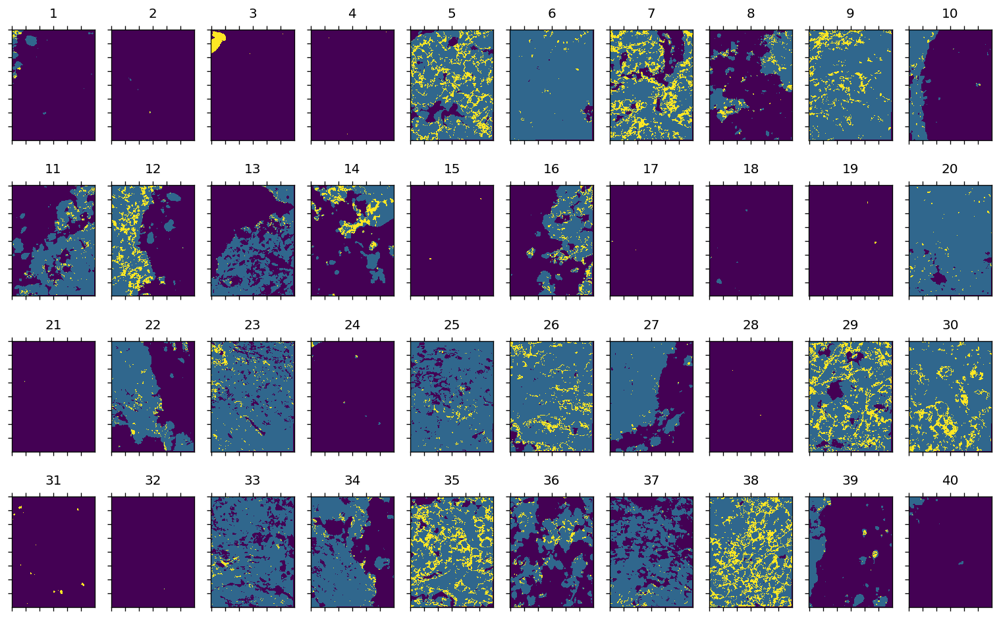

In [104]:
exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] == 2]
final_umap, masked_streams  = plot_umap_clusters(stream_1D, exact_pdhh)
pt.plot_masked(final_umap)
# cluster 2 pos

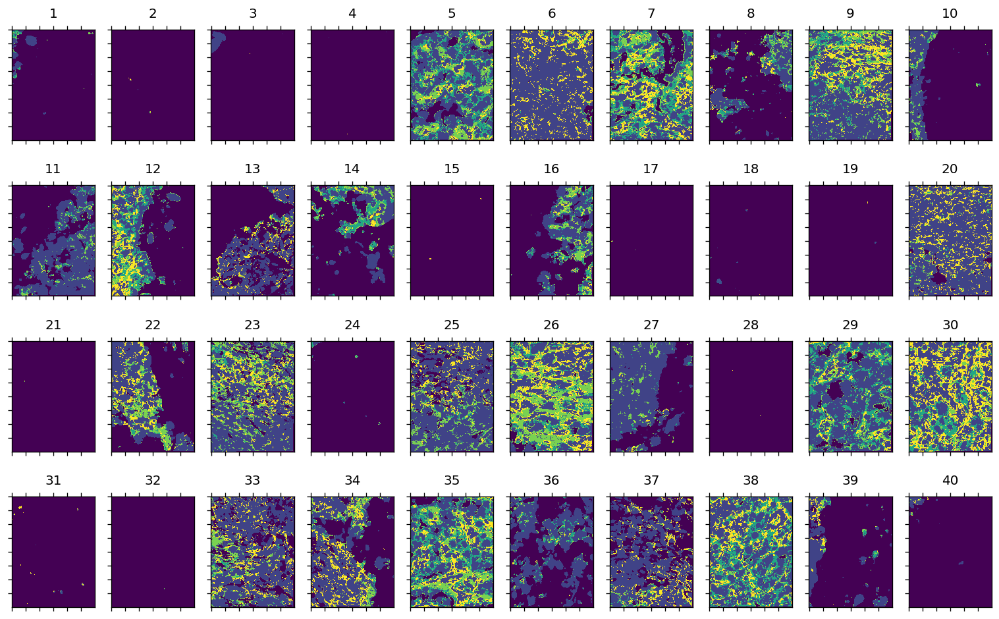

In [103]:
pt.plot_masked(final_umap)
# cluster 2-4 pos

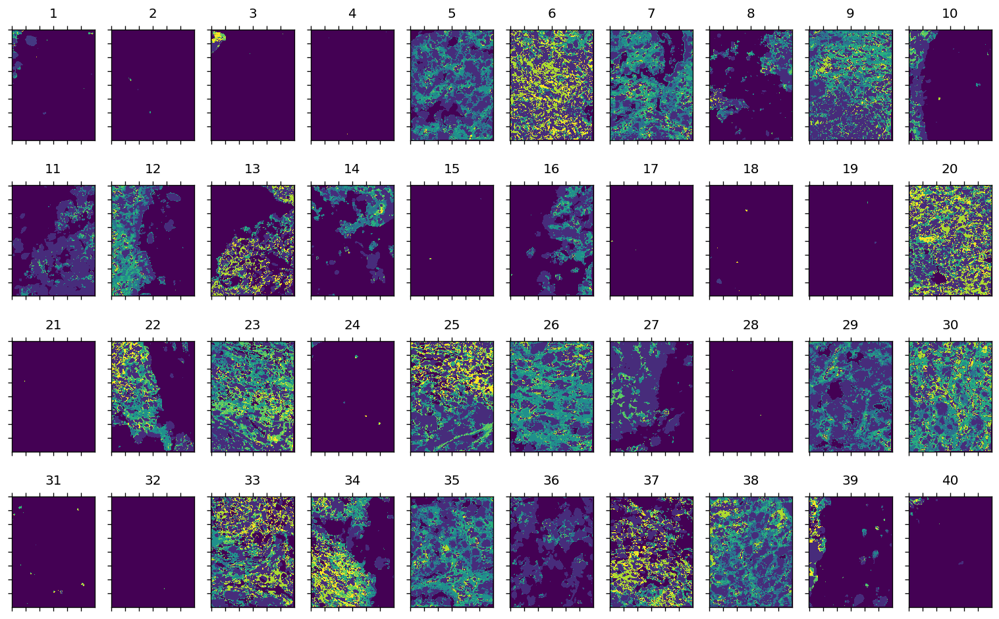

In [98]:
pt.plot_masked(final_umap)
# cluster 2-8 pos

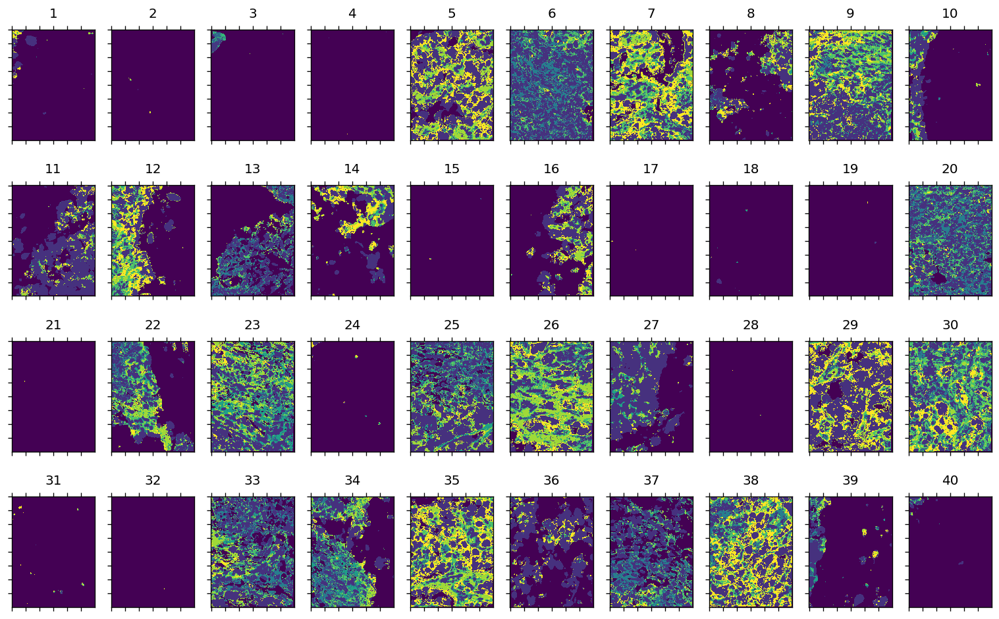

In [95]:
pt.plot_masked(final_umap)
# cluster 2-8

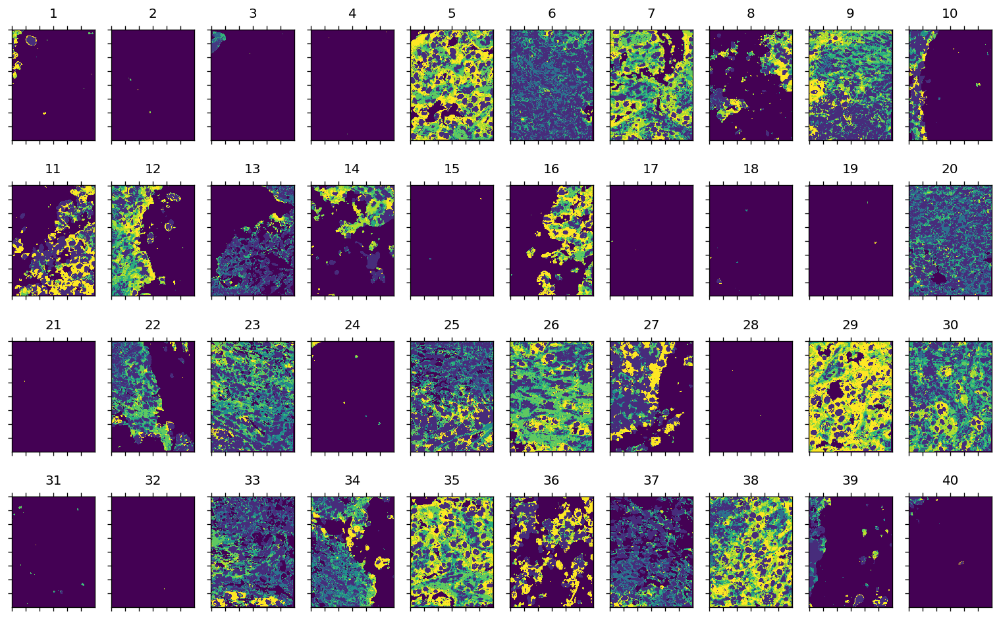

In [90]:
pt.plot_masked(final_umap)
# cluster 1-8